In [3]:
import numpy as np
import pandas as pd
import os
import random
from sklearn.utils import shuffle

#for text cleaning
import string
import re
import nltk
from nltk.tokenize import word_tokenize
from nltk.stem import PorterStemmer
from nltk.corpus import stopwords
from collections import Counter


# clustering
from gensim.models import word2vec, KeyedVectors
from sklearn.cluster import KMeans
from sklearn.neighbors import KDTree
from sklearn.decomposition import PCA
from sklearn.feature_extraction.text import TfidfVectorizer
import spacy

import re;
import logging;
import sqlite3;
import time;
import sys;
import multiprocessing;
from wordcloud import WordCloud, ImageColorGenerator, STOPWORDS
import matplotlib.pyplot as plt;
from itertools import cycle;

from tqdm import tqdm
tqdm.pandas()

In [4]:
SEED = 2021
#Importing the dataset
data = pd.read_csv("covidvaccine.csv")

C:\Users\achre\AppData\Local\Temp\ipykernel_18736\1454667067.py:3: DtypeWarning: Columns (5,6,7,12) have mixed types. Specify dtype option on import or set low_memory=False.
  data = pd.read_csv("covidvaccine.csv")


In [5]:
random.seed(SEED)
data.iloc[random.randint(0, len(data))]
def clean_text(txt):

    contraction_dict = {
        "ain't": "is not", "aren't": "are not","can't": "cannot", "'cause": "because", "could've": "could have",
        "couldn't": "could not", "didn't": "did not",  "doesn't": "does not", "don't": "do not",
        "hadn't": "had not", "hasn't": "has not", "haven't": "have not", "he'd": "he would","he'll": "he will",
        "he's": "he is", "how'd": "how did", "how'd'y": "how do you", "how'll": "how will", "how's": "how is",
        "I'd": "I would", "I'd've": "I would have", "I'll": "I will", "I'll've": "I will have","I'm": "I am",
        "I've": "I have", "i'd": "i would", "i'd've": "i would have", "i'll": "i will",  "i'll've": "i will have",
        "i'm": "i am", "i've": "i have", "isn't": "is not", "it'd": "it would", "it'd've": "it would have",
        "it'll": "it will", "it'll've": "it will have","it's": "it is", "let's": "let us", "ma'am": "madam",
        "mayn't": "may not", "might've": "might have","mightn't": "might not","mightn't've": "might not have",
        "must've": "must have", "mustn't": "must not", "mustn't've": "must not have", "needn't": "need not",
        "needn't've": "need not have","o'clock": "of the clock", "oughtn't": "ought not",
        "oughtn't've": "ought not have", "shan't": "shall not", "sha'n't": "shall not", "shan't've": "shall not have",
        "she'd": "she would", "she'd've": "she would have", "she'll": "she will", "she'll've": "she will have",
        "she's": "she is", "should've": "should have", "shouldn't": "should not", "shouldn't've": "should not have",
        "so've": "so have","so's": "so as", "this's": "this is","that'd": "that would", "that'd've": "that would have",
        "that's": "that is", "there'd": "there would", "there'd've": "there would have", "there's": "there is",
        "here's": "here is","they'd": "they would", "they'd've": "they would have", "they'll": "they will",
        "they'll've": "they will have", "they're": "they are", "they've": "they have", "to've": "to have",
        "wasn't": "was not", "we'd": "we would", "we'd've": "we would have", "we'll": "we will",
        "we'll've": "we will have", "we're": "we are", "we've": "we have", "weren't": "were not", "what'll": "what will",
        "what'll've": "what will have", "what're": "what are",  "what's": "what is", "what've": "what have",
        "when's": "when is", "when've": "when have", "where'd": "where did", "where's": "where is",
        "where've": "where have", "who'll": "who will", "who'll've": "who will have", "who's": "who is",
        "who've": "who have", "why's": "why is", "why've": "why have", "will've": "will have", "won't": "will not",
        "won't've": "will not have", "would've": "would have", "wouldn't": "would not", "wouldn't've": "would not have",
        "y'all": "you all", "y'all'd": "you all would","y'all'd've": "you all would have","y'all're": "you all are",
        "y'all've": "you all have","you'd": "you would", "you'd've": "you would have", "you'll": "you will",
        "you'll've": "you will have", "you're": "you are", "you've": "you have"}
    def _get_contractions(contraction_dict):
        contraction_re = re.compile('(%s)' % '|'.join(contraction_dict.keys()))
        return contraction_dict, contraction_re

    def replace_contractions(text):
        contractions, contractions_re = _get_contractions(contraction_dict)
        def replace(match):
            return contractions[match.group(0)]
        return contractions_re.sub(replace, text)

    # replace contractions
    txt = replace_contractions(txt)

    #remove punctuations
    txt  = "".join([char for char in txt if char not in string.punctuation])
    txt = re.sub('[0-9]+', '', txt)

    # split into words
    words = word_tokenize(txt)

    # remove stopwords
    stop_words = set(stopwords.words('english'))
    words = [w for w in words if not w in stop_words]

    # removing leftover punctuations
    words = [word for word in words if word.isalpha()]

    # lower-case everything
    words = [w.lower() for w in words]

    # stem the words
    porter = PorterStemmer()
    words = [porter.stem(w) for w in words]


    cleaned_text = ' '.join(words)
    return cleaned_text
data = data[['text', 'hashtags']].fillna('')
data.head()

data['raw_tweet'] = data['text'] + ' ' + data['hashtags']

data.head()

,text,hashtags,raw_tweet
0,Australia to Manufacture Covid-19 Vaccine and ...,['CovidVaccine'],Australia to Manufacture Covid-19 Vaccine and ...
1,#CoronavirusVaccine #CoronaVaccine #CovidVacci...,"['CoronavirusVaccine', 'CoronaVaccine', 'Covid...",#CoronavirusVaccine #CoronaVaccine #CovidVacci...
2,Deaths due to COVID-19 in Affected Countries\n...,,Deaths due to COVID-19 in Affected Countries\n...
3,@Team_Subhashree @subhashreesotwe @iamrajchoco...,,@Team_Subhashree @subhashreesotwe @iamrajchoco...
4,@michellegrattan @ConversationEDU This is what...,,@michellegrattan @ConversationEDU This is what...


In [16]:
import nltk
nltk.download()
data['tweet'] = data['raw_tweet'].progress_apply(lambda txt: clean_text(txt))
data.head()
data.sort_values(by=['tweet']).head()
df = data[data['tweet'].astype(bool)]
df.sort_values(by=['tweet']).head()
df = df[['hashtags', 'tweet']]
df.sort_values(by=['tweet']).head()
df['tweet_split'] = df.tweet.str.split()
df.head()
max_len = df.tweet.str.len().max()
print(max_len)
from sklearn.feature_extraction.text import HashingVectorizer
# list of text documents
text = ["The quick brown fox jumped over the lazy dog."]
# create the transform
vectorizer = HashingVectorizer(n_features=20)
# encode document
vector = vectorizer.transform(text)
# summarize encoded vector
print(vector.shape)
print(vector.toarray())
vectorizer = HashingVectorizer (n_features = max_len)
df['vector'] = df['tweet'].progress_apply(lambda t: vectorizer.fit_transform([t]).toarray())
df.head()
X = np.concatenate(df['vector'].values)
kmeans = KMeans(n_clusters = 4)
df['cluster'] = kmeans.fit_predict(X)
pca = PCA(n_components=3)
pca_result = pca.fit_transform(X)
df['x'] = pca_result[:, 0]
df['y'] = pca_result[:, 1]
#df['z'] = pca_result[:, 2]
df.head()
cluster_colors = np.array(['#e6194b', '#3cb44b', '#ffe119', '#4363d8', '#f58231', '#911eb4', '#46f0f0', '#f032e6', '#bcf60c', '#fabebe', '#008080', '#e6beff', '#9a6324', '#fffac8', '#800000', '#aaffc3', '#808000', '#ffd8b1', '#000075', '#808080', '#ffffff', '#000000'])
df['color'] = cluster_colors[df.cluster.values]
df['text'] = df.tweet.str[:50]
import bokeh.io
from bokeh.io import push_notebook, show, output_notebook
from bokeh.plotting import figure
from bokeh.models import ColumnDataSource, LabelSet

# from bokeh.charts import Donut, HeatMap, Histogram, Line, Scatter, show, output_notebook, output_file
bokeh.io.output_notebook()

  0%|          | 1/207006 [00:00<20:24:56,  2.82it/s]


AttributeError: 'set' object has no attribute 'words'

In [7]:
#visualize the data using bokeh
#output_file("top_artists.html", title="top artists")
# TOOLS = "pan,wheel_zoom,box_zoom,reset,hover,previewsave"

source = ColumnDataSource.from_df(df[['x', 'y', 'color', 'text']])
TOOLTIPS = [("text", "@text")]
TOOLS = "pan,wheel_zoom,box_zoom,reset,hover,save"

plot = figure(plot_width=800, plot_height=450, tooltips=TOOLTIPS, tools=TOOLS)

#draw circles
plot.circle(y='y', x='x', source=source, size=15, fill_color='color')
show(plot)
df.head()
df.query('cluster == 4').tweet

Series([], Name: tweet, dtype: object)

In [8]:
cluster0 = df.query('cluster == 0').tweet
cluster1 = df.query('cluster == 1').tweet
cluster2 = df.query('cluster == 2').tweet
cluster3 = df.query('cluster == 3').tweet


text0 = ' '.join(tweet for tweet in cluster0)
text1 = ' '.join(tweet for tweet in cluster1)
text2 = ' '.join(tweet for tweet in cluster2)
text3 = ' '.join(tweet for tweet in cluster3)

print(f'There are {len(text0)} words in the combination of all cells in column "tweet" labeled as cluster 0.')
print(f'There are {len(text1)} words in the combination of all cells in column "tweet" labeled as cluster 1.')
print(f'There are {len(text2)} words in the combination of all cells in column "tweet" labeled as cluster 2.')
print(f'There are {len(text3)} words in the combination of all cells in column "tweet" labeled as cluster 3.')

There are 3719802 words in the combination of all cells in column "tweet" labeled as cluster 0.
There are 8940886 words in the combination of all cells in column "tweet" labeled as cluster 1.
There are 3354992 words in the combination of all cells in column "tweet" labeled as cluster 2.
There are 4672521 words in the combination of all cells in column "tweet" labeled as cluster 3.


In [9]:
# create stopwords
stopwords = set(STOPWORDS)
stopwords.update(['amp', 'covid', 'covidvaccin', 'vaccin', 'today', 'peopl', 'coronaviru', 'say', 'day','got', 'one','thank','go','take','new','first','dose','need','shot','thi',
                  'n','u','receiv','second'])
# I want to see what's left after filtered out the common keywords

In [10]:
wordcloud0 = WordCloud(stopwords=stopwords, background_color='white').generate(text0)
wordcloud1 = WordCloud(stopwords=stopwords, background_color='white').generate(text1)
wordcloud2 = WordCloud(stopwords=stopwords, background_color='white').generate(text2)
wordcloud3 = WordCloud(stopwords=stopwords, background_color='white').generate(text3)

wordcloud = [wordcloud0, wordcloud1, wordcloud2, wordcloud3]

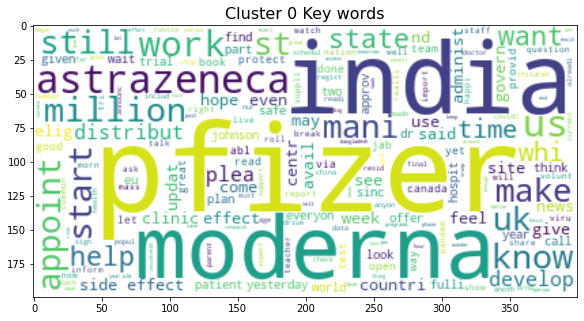

In [11]:
# cluster 0
plt.figure(figsize=(10,5))
plt.tight_layout(pad=0)
plt.imshow(wordcloud0, interpolation='bilinear')
plt.title('Cluster 0 Key words', size=16)
plt.show()

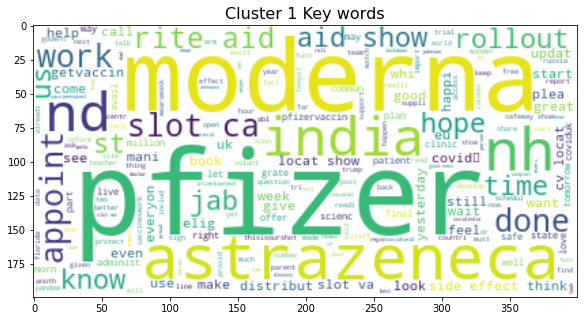

In [12]:
# cluster 1
plt.figure(figsize=(10,5))
plt.tight_layout(pad=0)
plt.imshow(wordcloud1, interpolation='bilinear')
plt.title('Cluster 1 Key words', size=16)
plt.show()

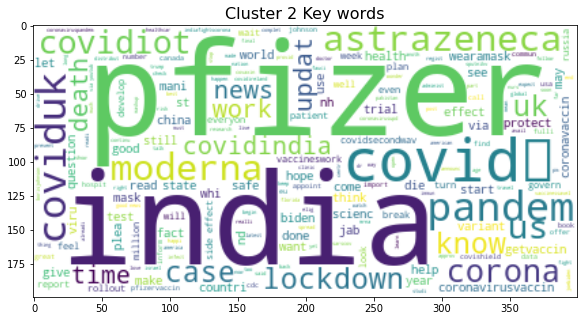

In [15]:
# cluster 2
plt.figure(figsize=(10,5))
plt.tight_layout(pad=0)
plt.imshow(wordcloud2, interpolation='bilinear')
plt.title('Cluster 2 Key words', size=16)
plt.show()

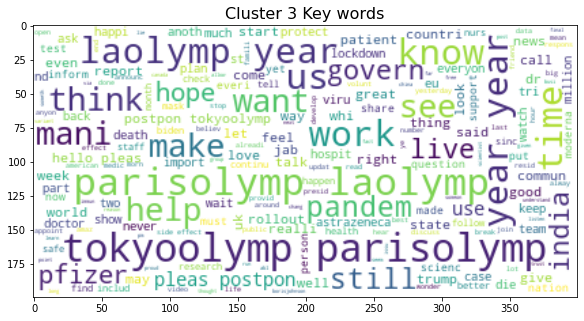

In [14]:
# cluster 3
plt.figure(figsize=(10,5))
plt.tight_layout(pad=0)
plt.imshow(wordcloud3, interpolation='bilinear')
plt.title('Cluster 3 Key words', size=16)
plt.show()